## Download & Extract Images

In [1]:
!gdown https://drive.google.com/uc?id=1iSm_jNCaemIjxBe2DLLyXcH_KAYQniCA
!unzip -q /content/dataset.zip

Downloading...
From: https://drive.google.com/uc?id=1iSm_jNCaemIjxBe2DLLyXcH_KAYQniCA
To: /content/dataset.zip
100% 35.0M/35.0M [00:00<00:00, 163MB/s]


## Download & Extract Checkpoint from Training (30 Epoch)

In [2]:
!gdown https://drive.google.com/uc?id=1eKnrNILngd4NdCkOTMg_UuGuwmQB4vwv
!unzip -q /content/outputs_finetune30.zip 

Downloading...
From: https://drive.google.com/uc?id=1eKnrNILngd4NdCkOTMg_UuGuwmQB4vwv
To: /content/outputs_finetune30.zip
100% 432M/432M [00:01<00:00, 236MB/s]


## Clone DETR Repo

In [3]:
import sys

!git clone https://github.com/aivclab/detr
!pip install -r /content/detr/requirements.txt
!pip install torch==1.8.0 torchvision==0.9.0
sys.path.append('/content/detr')

Cloning into 'detr'...
remote: Enumerating objects: 264, done.
remote: Total 264 (delta 0), reused 0 (delta 0), pack-reused 264
Receiving objects: 100% (264/264), 14.14 MiB | 13.27 MiB/s, done.
Resolving deltas: 100% (144/144), done.
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-install-44zr5e9q/pycocotools_3c51650ea2884780b2e1d1512fa9d6f3
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-install-44zr5e9q/pycocotools_3c51650ea2884780b2e1d1512fa9d6f3
  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-install-44zr5e9q/panopticapi_a9f16c9f2602412589a46362abd0fae7
  Running command git clone -q https://github.com/cocodataset/panopticapi.git /tmp/pip-install-44zr5e9q/panopticapi_a9f16c9f2602412589a46362abd0fae7
     |████████████████████████████████| 70 kB 3.6 MB/s 
     |████████████████████████████████| 12.7 MB 8.7 MB/s 
     |████████████████████████████████| 4.9 MB 53.7 MB/s 
  Created wheel for pycocotools: filename=

## Preliminaries & Model

Reference [DETR GitHub (Fork) main.py](https://github.com/aivclab/detr/blob/master/main.py) & [DETR Colab](https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_demo.ipynb)

In [4]:
import argparse

parser = argparse.ArgumentParser() 
parser.add_argument('--num_classes', type=int, default=4)
parser.add_argument('--dataset_file', default='coco')
parser.add_argument('--device', default='cuda')
parser.add_argument('--hidden_dim', type=int, default=256)
parser.add_argument('--position_embedding', type=str, default='sine')
parser.add_argument('--lr', type=float, default=1e-5)
parser.add_argument('--lr_backbone', type=float, default=1e-6)
parser.add_argument('--masks', action='store_true')
parser.add_argument('--backbone', type=str, default='resnet50')
parser.add_argument('--dilation', action='store_true')
parser.add_argument('--dropout', type=float, default=0.1)
parser.add_argument('--nheads', type=int, default=8)
parser.add_argument('--dim_feedforward', type=int, default=2048)
parser.add_argument('--enc_layers', type=int, default=6)
parser.add_argument('--dec_layers', type=int, default=6)
parser.add_argument('--pre_norm', action='store_true')
parser.add_argument('--num_queries', type=int, default=100)
parser.add_argument('--no_aux_loss', dest='aux_loss', action='store_false')
parser.add_argument('--set_cost_class', type=float, default=1)
parser.add_argument('--set_cost_bbox', type=float, default=5)
parser.add_argument('--set_cost_giou', type=float, default=2)
parser.add_argument('--bbox_loss_coef', type=float, default=5)
parser.add_argument('--giou_loss_coef', type=float, default=2)
parser.add_argument('--eos_coef', type=float, default=0.1)
args = parser.parse_args(args=[])

In [5]:
from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);
from detr.models import build_model

model, criterion, postprocessors  = build_model(args)
checkpoint = torch.load('/content/new_outputs/checkpoint.pth')
model.load_state_dict(checkpoint['model'])
model.eval()

Building a DETR model with 4 classes


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
       

In [6]:
CLASSES = ['N/A', 'bio', 'plastic', 'rov']

COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [7]:
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [8]:
def detect(im, model, transform):
    img = transform(im).unsqueeze(0)

    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600

    outputs = model(img)

    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.7

    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    return probas[keep], bboxes_scaled

In [9]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Detection

The images used is from test directory (dataset)

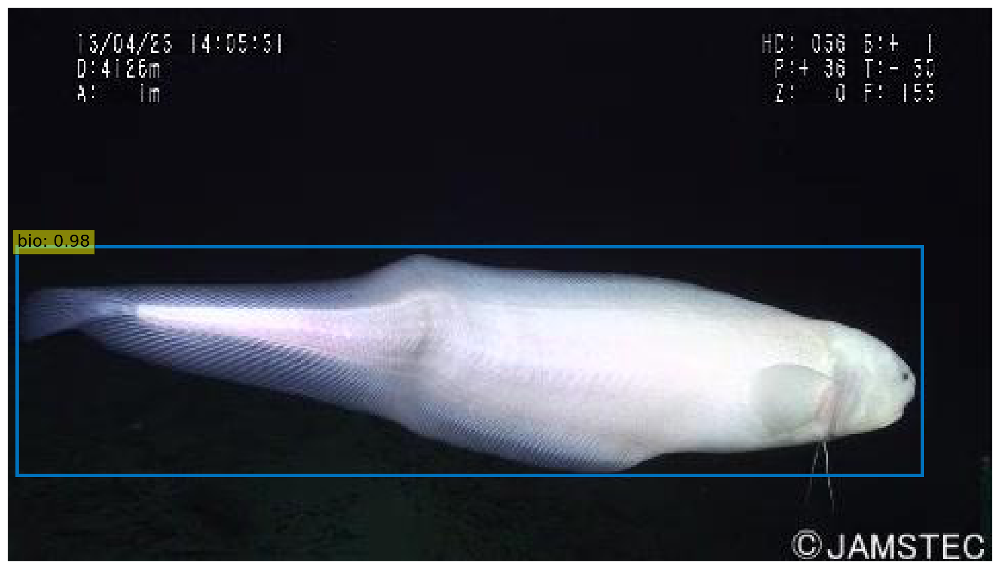

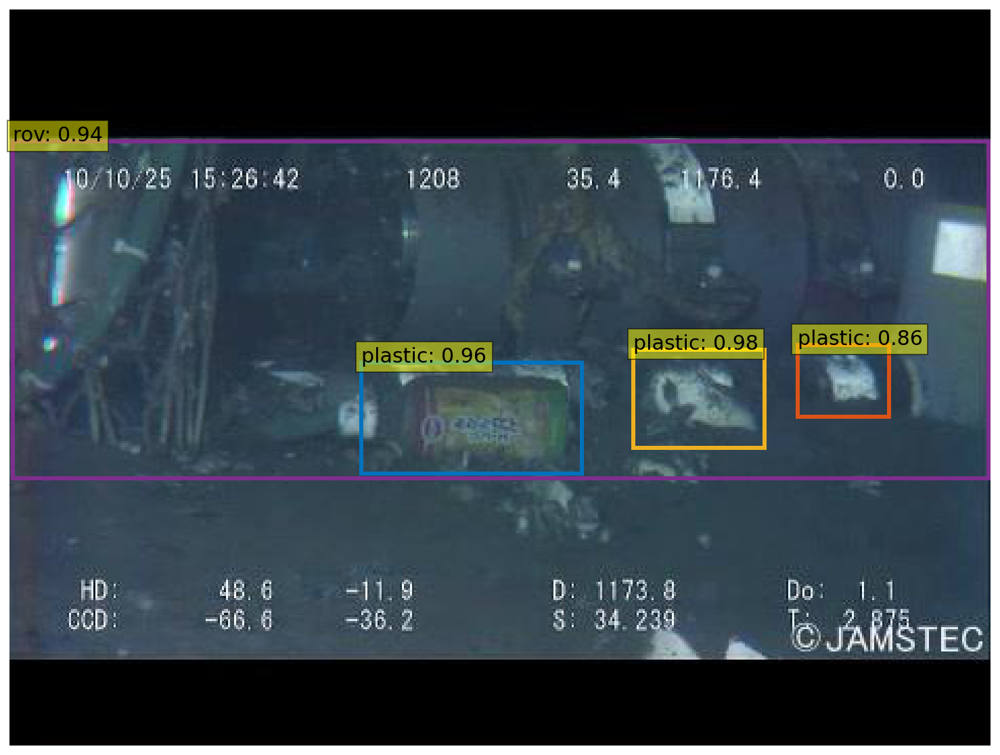

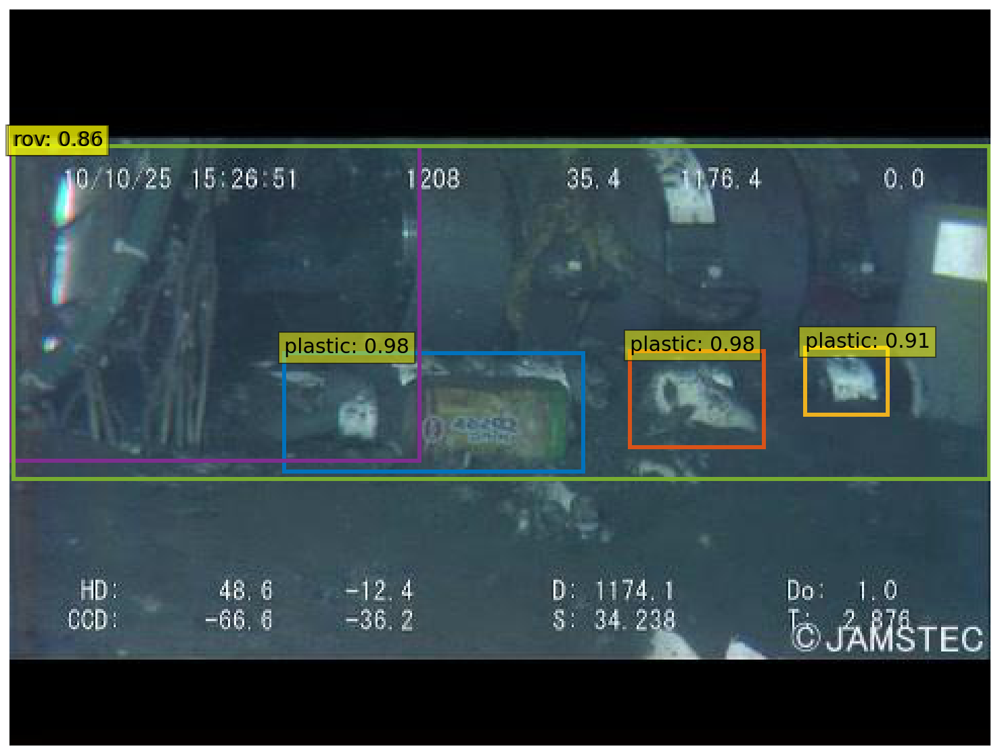

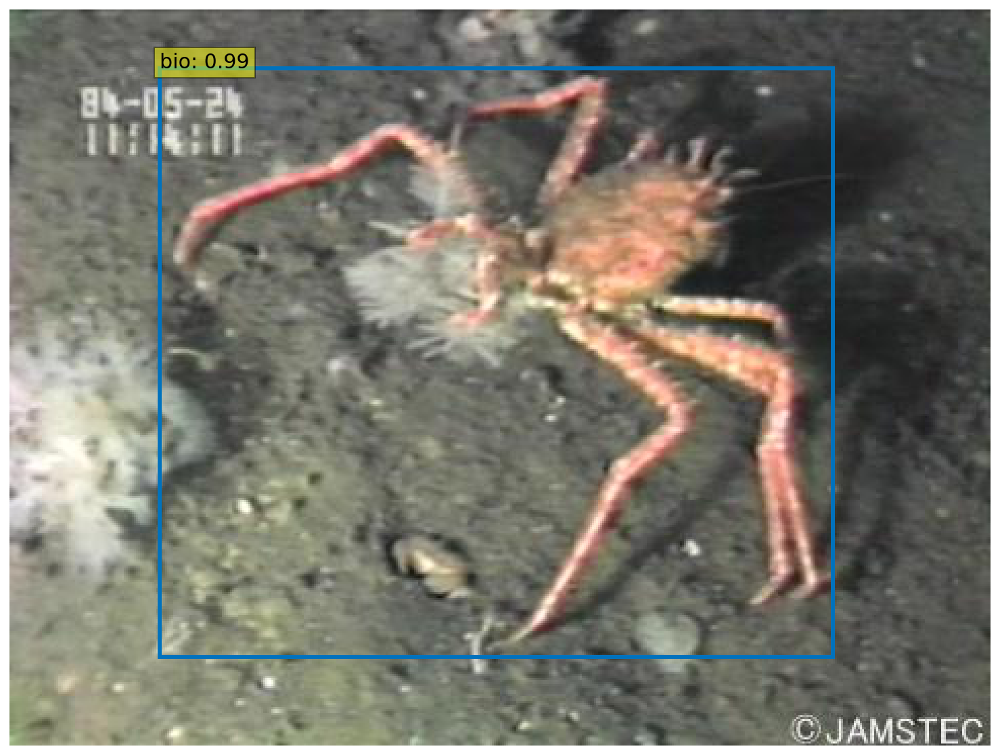

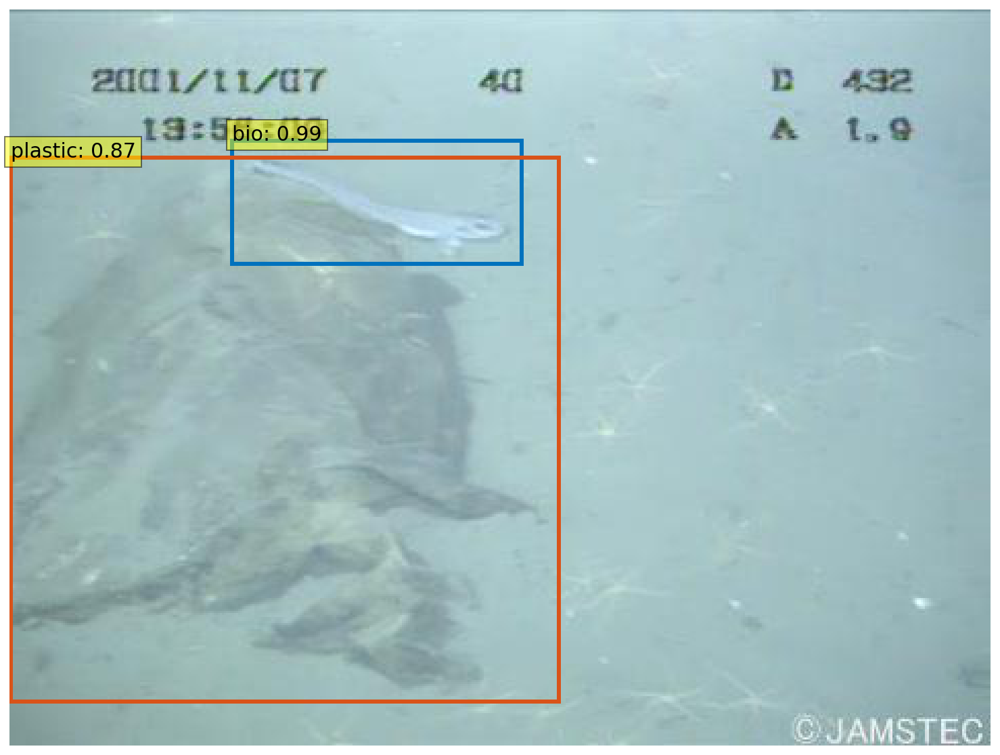

...

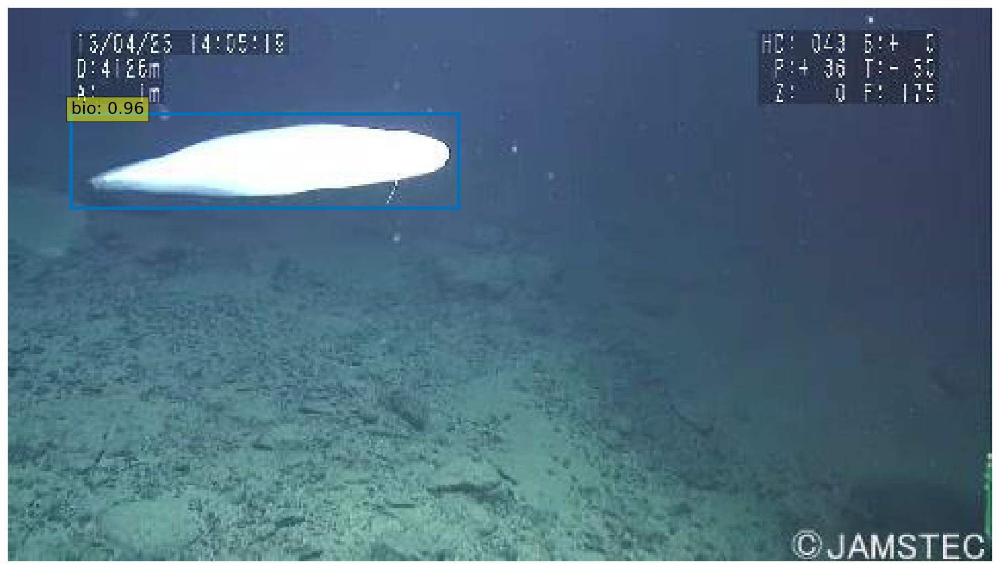

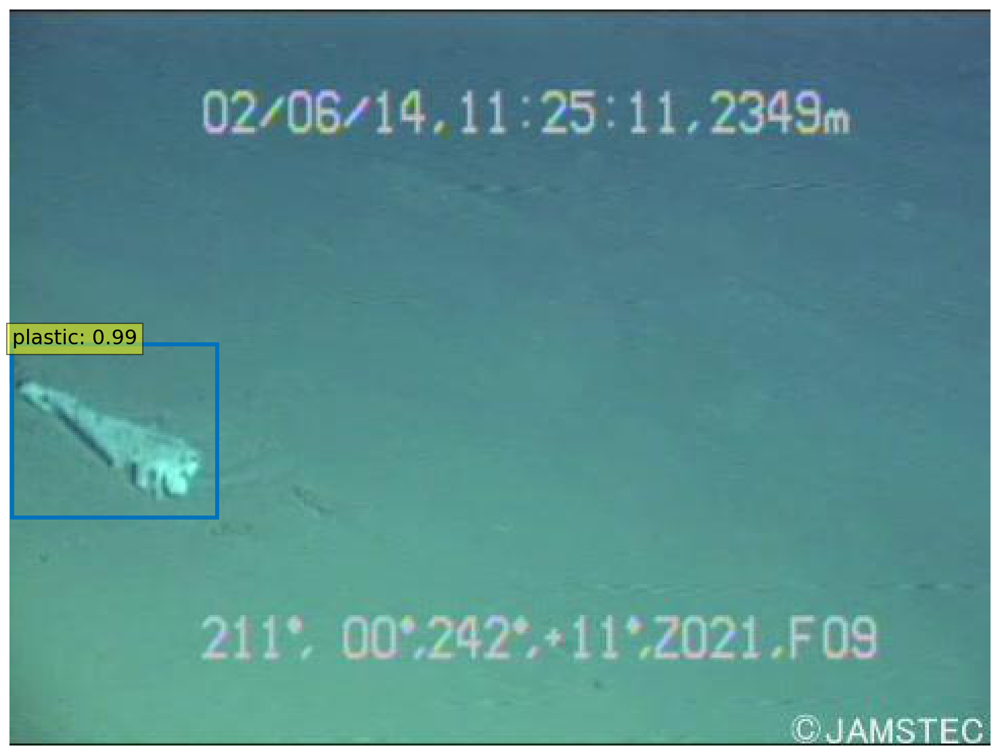

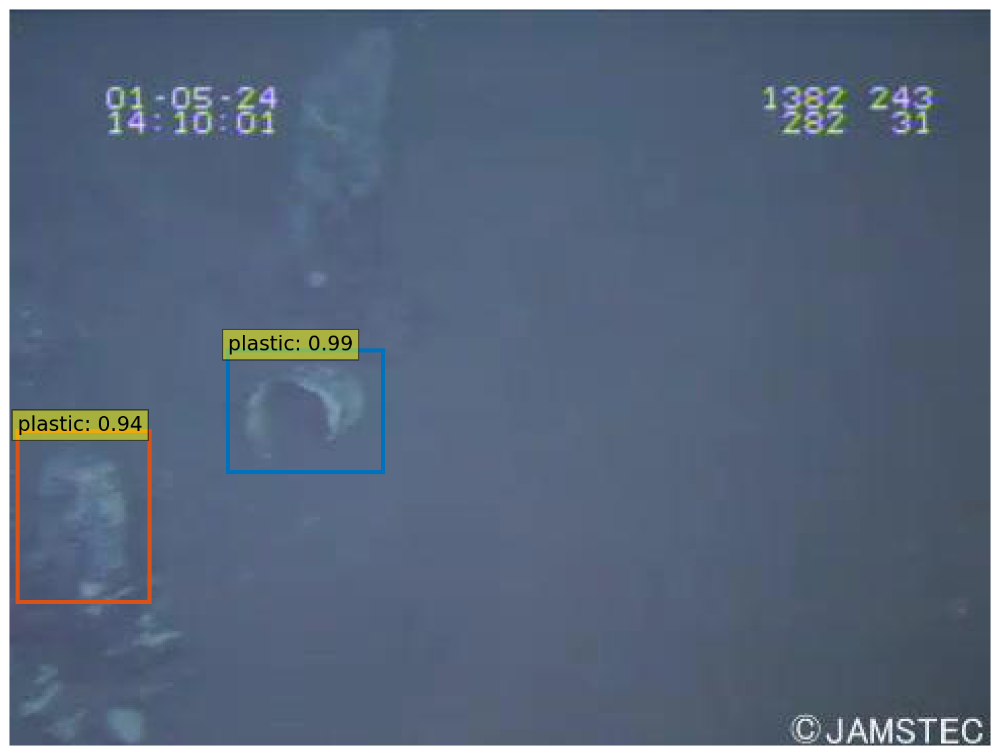

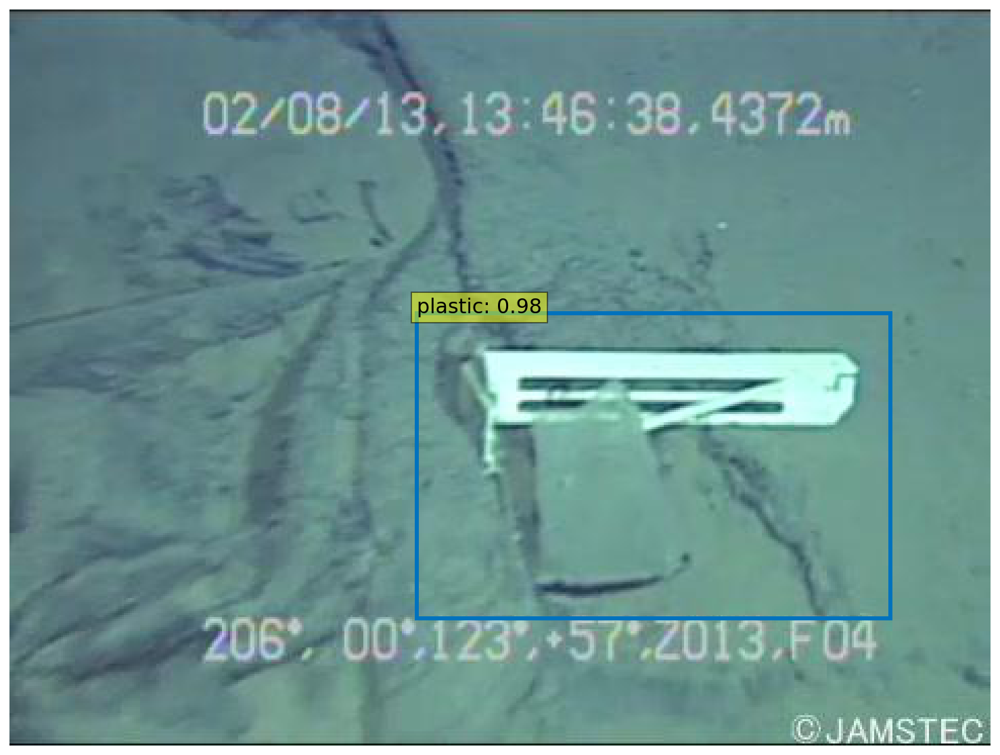

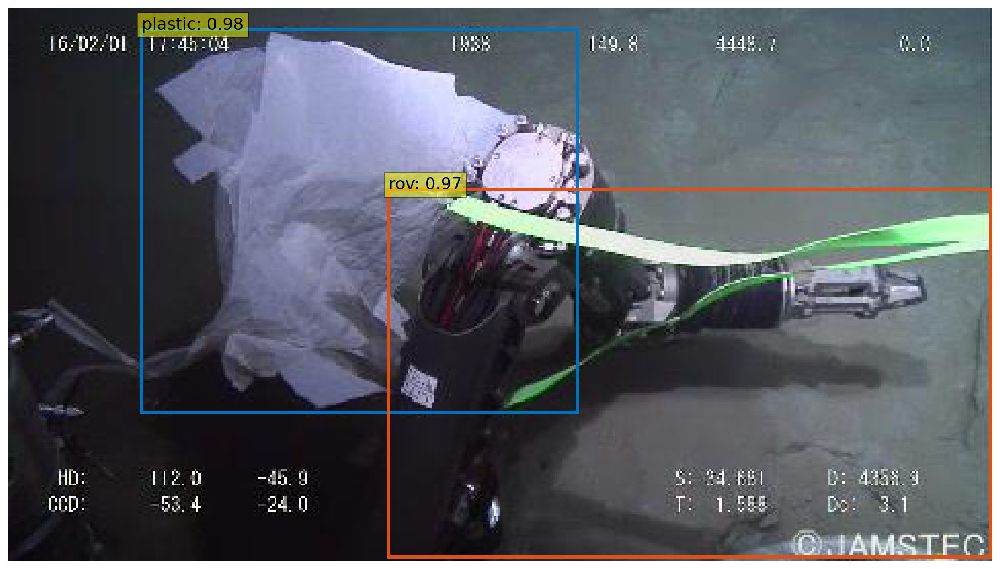

In [10]:
import os
import random

images_dir = '/content/dataset/test/'
images = os.listdir('/content/dataset/test/')

for i in range(0, 35):
  im = Image.open(r'%s' %os.path.join(images_dir, images[i]))
  scores, boxes = detect(im, model, transform)
  plot_results(im, scores, boxes)
  print('\n')